## FCN - Simulate the `Detection Layer` Process 

We generate the inputs to `DetectTargetLayer` , to manipulate and modify the layer to procduce a modified `output_rois` 
containing false positives. 
This will be passed on the the heatmap layer, and through there will become the input to FCN.

#### setup MRCNN and FCN models and load weights

In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
%matplotlib inline
# %matplotlib notebook
%load_ext autoreload
%autoreload 2
import sys,os, pprint
pp = pprint.PrettyPrinter(indent=2, width=100)
print('Current working dir: ', os.getcwd())
if '..' not in sys.path:
    print("appending '..' to sys.path")
    sys.path.append('..')
    
import numpy as np
# import matplotlib as plt
import mrcnn.utils     as utils
import mrcnn.visualize as visualize
import mrcnn.visualize_2 as vis2
import mrcnn.visualize_3 as vis3

from mrcnn.prep_notebook import build_fcn_inference_pipeline, build_mrcnn_inference_pipeline,run_mrcnn_detection
from mrcnn.visualize     import display_training_batch
from mrcnn.prep_notebook import get_inference_batch, get_image_batch, run_mrcnn_detection, run_fcn_detection
from mrcnn.coco import prep_coco_dataset
# from mrcnn.visualize import (plot_3d_heatmap, plot_2d_heatmap, plot_2d_heatmap_compare, plot_3d_heatmap_compare,
#                             display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn, display_heatmaps_mrcnn_fcn)
# from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn, inference_heatmaps_display
                             
# WEIGHT_FILE = 'F:/models/train_fcn8_coco_adam/fcn20181109T0000/fcn_2298.h5'

##------------------------------------------------------------------------------------
## Parse command line arguments
##------------------------------------------------------------------------------------
parser = utils.command_line_parser()
input_parms  =" --batch_size     1  "
input_parms +=" --dataset       coco2014"
input_parms +=" --mrcnn_logs_dir train_mrcnn "
input_parms +=" --fcn_logs_dir   train_fcn8_BCE " 

input_parms +=" --mrcnn_model    last "
input_parms +=" --fcn_model    last"
# input_parms +=" --mrcnn_model      " + WEIGHT_FILE + "  "
# input_parms +=" --fcn_model      " + WEIGHT_FILE + "  "
input_parms +=" --fcn_layer      all"
input_parms +=" --fcn_arch       fcn8 " 
input_parms +=" --sysout         screen "
input_parms +=" --scale_factor   4"
# input_parms +=" --coco_classes   78 79 80 81 82 44 46 47 48 49 50 51 34 35 36 37 38 39 40 41 42 43 "
input_parms +=" --coco_classes       78 79 80 81 82 44 46 47 48 49 50 51 34 35 36 37 38 39 40 41 42 43 10 11 13 14 15 "

args = parser.parse_args(input_parms.split())
utils.display_input_parms(args)


Current working dir:  /home/kbardool/git_projs/mrcnn3/notebooks
appending '..' to sys.path


Using TensorFlow backend.


 Init Image Class - Possible Object Choices:  {'airplane': 3, 'cloud': 3, 'truck': 3, 'person': 5, 'building': 3, 'car': 3, 'tree': 5, 'sun': 1}
 Init Image Class - Custom Color Keys      :  ['cloud', 'ground', 'sun', 'tree', 'person', 'sky']
 Init Image Class - Object Priority List   :  ['building', 'tree', 'car']
 Init Image Class - BUILD_MAX_TRIES        :  7
 Init Image Class - PERSON_CAR_DISTANCE    :  10

   Arguments passed :
   --------------------
   batch_size                     1
   coco_classes                   [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
   dataset                        coco2014
   epochs                         1
   evaluate_method                1
   fcn_arch                       FCN8
   fcn_bce_loss_class             0
   fcn_bce_loss_method            1
   fcn_layers                     ['all']
   fcn_logs_dir                   train_fcn8_BCE
   fcn_losses                     fcn_BCE_l

In [2]:
mrcnn_model, fcn_model = build_fcn_inference_pipeline(args = args,verbose = 1)


--> Execution started at: 07-29-2019 @ 15:58:28
    Tensorflow Version: 1.8.0   Keras Version : 2.1.6 
>>> Initialize Paths
 Linx  Linux

   Arguments passed :
   --------------------
   batch_size                     1
   coco_classes                   [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
   dataset                        coco2014
   epochs                         1
   evaluate_method                1
   fcn_arch                       FCN8
   fcn_bce_loss_class             0
   fcn_bce_loss_method            1
   fcn_layers                     ['all']
   fcn_logs_dir                   train_fcn8_BCE
   fcn_losses                     fcn_BCE_loss
   fcn_model                      last
   last_epoch                     0
   lr                             0.001
   mrcnn_exclude_layers           None
   mrcnn_layers                   ['mrcnn', 'fpn', 'rpn']
   mrcnn_logs_dir                 train_mrcnn
   mrcnn_model

    FPN P4 (Conv2D (3,3) of P4)    :  shape: (?, 64, 64, 256)      KB.shape:(None, 64, 64, 256)   Keras Tensor: True
    FPN P3 (Conv2D (3,3) of P3)    :  shape: (?, 128, 128, 256)    KB.shape:(None, 128, 128, 256)  Keras Tensor: True
    FPN P2 (Conv2D (3,3) of P2)    :  shape: (?, 256, 256, 256)    KB.shape:(None, 256, 256, 256)  Keras Tensor: True

>>> RPN Layer 
     append Tensor("fpn_p2/BiasAdd:0", shape=(?, 256, 256, 256), dtype=float32) to layer_outputs 
     append Tensor("fpn_p3/BiasAdd:0", shape=(?, 128, 128, 256), dtype=float32) to layer_outputs 
     append Tensor("fpn_p4/BiasAdd:0", shape=(?, 64, 64, 256), dtype=float32) to layer_outputs 
     append Tensor("fpn_p5/BiasAdd:0", shape=(?, 32, 32, 256), dtype=float32) to layer_outputs 
     append Tensor("fpn_p6/MaxPool:0", shape=(?, 16, 16, 256), dtype=float32) to layer_outputs 

>>> RPN Outputs  <class 'list'>
      rpn_class_logits/rpn_class_logits:0
      rpn_class/rpn_class:0
      rpn_bbox/rpn_bbox:0

>>> Proposal Laye

    hm_indices                     :  shape: (?, 2)                KB.shape:(None, 2)             Keras Tensor: False
    pt2_heatmaps                   :  shape: (?, 256, 256)         KB.shape:(None, 256, 256)      Keras Tensor: False
    alt_scores_2    :              :  shape: (?, 3)                KB.shape:(None, 3)             Keras Tensor: False
    alt_scores_2(scattered)        :  shape: (1, 81, 200, 3)       KB.shape:(1, 81, 200, 3)       Keras Tensor: False
    alt_scores_2_norm(by_class)    :  shape: (1, 81, 200, 3)       KB.shape:(1, 81, 200, 3)       Keras Tensor: False
    gauss_heatmap_sum (final)      :  shape: (1, 256, 256, 81)     KB.shape:(1, 256, 256, 81)     Keras Tensor: False
    gauss_scores    :              :  shape: (1, 81, 200, 24)      KB.shape:(1, 81, 200, 24)      Keras Tensor: False
    complete                       

    Output of CHMLayerInference: 
     pred_tensor        :  (1, 81, 200, 9) Keras tensor  False
     pred_heatmap_norm  :  (1, 256, 256,

    FCN Block 51                   :  shape: (?, 16, 16, 512)      KB.shape:(None, 16, 16, 512)   Keras Tensor: True
    FCN Block 52                   :  shape: (?, 16, 16, 512)      KB.shape:(None, 16, 16, 512)   Keras Tensor: True
    FCN Block 53                   :  shape: (?, 16, 16, 512)      KB.shape:(None, 16, 16, 512)   Keras Tensor: True
    FCN Block 54 (Max pooling)     :  shape: (?, 8, 8, 512)        KB.shape:(None, 8, 8, 512)     Keras Tensor: True

   --- FCN32 ----------------------------
    FCN fully connected 1 (fc1)    :  shape: (?, 8, 8, 4096)       KB.shape:(None, 8, 8, 4096)    Keras Tensor: True
    FCN fully connected 2 (fc2)    :  shape: (?, 8, 8, 4096)       KB.shape:(None, 8, 8, 4096)    Keras Tensor: True
    FCN conv2d (fcn32_deconv2D)    :  shape: (?, 8, 8, 81)         KB.shape:(None, 8, 8, 81)      Keras Tensor: True

   --- FCN16 ----------------------------
    FCN scorePool4 (Conv2D(Pool4)) :  shape: (?, 16, 16, 81)       KB.shape:(None, 16, 16, 81) 

    alt_scores_1                   :  shape: (?, 3)                KB.shape:(None, 3)             Keras Tensor: False
    alt_scores_1_scattered         :  shape: (1, 81, 200, 3)       KB.shape:(1, 81, 200, 3)       Keras Tensor: False
    alt_scores_1_norm(by_class)    :  shape: (1, 81, 200, 3)       KB.shape:(1, 81, 200, 3)       Keras Tensor: False
    alt_scores_1_norm(by_image)    :  shape: (?, 3)                KB.shape:(None, 3)             Keras Tensor: False
    Normalize heatmap within each class !-------------------------------------
    in_heatmap                     :  shape: (?, 256, 256, 81)     KB.shape:(None, 256, 256, 81)  Keras Tensor: False
    in_heatmap_norm                :  shape: (?, 81, 256, 256)     KB.shape:(None, 81, 256, 256)  Keras Tensor: False
    normalizer shape               :  shape: (?, 81, 1, 1)         KB.shape:(None, 81, 1, 1)      Keras Tensor: False
    normalized heatmap             :  shape: (?, 81, 256, 256)     KB.shape:(None, 81, 256, 256

### Build test datasets

In [3]:
print('load coco classes: ', args.coco_classes)
##------------------------------------------------------------------------------------
## Build & Load Training and Validation datasets
##------------------------------------------------------------------------------------
loadAnns='active_only'
# loadAnns='all_classes'
# dataset_test = prep_coco_dataset(['val'], mrcnn_model.config, generator = False , return_coco = True, active_class_ids=load_class_ids)
# dataset_test = prep_coco_dataset(["train", "val35k"], mrcnn_model.config, generator = False , return_coco = True, load_coco_classes=args.coco_classes)
# dataset_test   = prep_coco_dataset(["minival"], mrcnn_model.config, generator = False , 
#                                    return_coco = False,
#                                    load_coco_classes=args.coco_classes, 
#                                    loadAnns=loadAnns)
### Load dataset ALL CLASSES ---------------------------------------------------------------------------------
# loadAnns='all_classes'
dataset_test, test_generator = prep_coco_dataset(["train", "val35k"], mrcnn_model.config, generator = True ,
                                                 return_coco = False,
                                                 shuffle = False,
                                                 load_coco_classes=args.coco_classes,
                                                 loadAnns = loadAnns)
###------------------------------------------------------------------------------------------------------ 
dataset_test.display_class_info()
dataset_test.display_active_class_info()
print("Testing Dataset Image Count: {}".format(len(dataset_test.image_ids)))
print("Testing Dataset Class Count: {}".format(dataset_test.num_classes))
class_names = dataset_test.class_names


load coco classes:  [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
          !!! Loading annotations for ACTIVE CLASSES ONLY !!!
 Dataset dir :  /home/kbardool/MLDatasets/coco2014  subset:  train
loading annotations into memory...
Done (t=14.31s)
creating index...
index created!
 load subset of classes:  [78, 79, 80, 81, 82, 44, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 10, 11, 13, 14, 15]
 image dir            :  /home/kbardool/MLDatasets/coco2014/train2014
 json_path_dir        :  /home/kbardool/MLDatasets/coco2014/annotations/instances_train2014.json
 number of images     :  40400
 image_ids[:10]       :  [262146, 524291, 9, 393227, 393230, 131087, 393241, 393242, 131099, 393251]
 image_ids[1000:1010] :  [396150, 265080, 396157, 2951, 396172, 134032, 134033, 527250, 2963, 2964]
          !!! Loading annotations for ACTIVE CLASSES ONLY !!!
 Dataset dir :  /home/kbardool/MLDatasets/coco2014  subset:  v

In [4]:
def get_coco_image_id(coco_id):
    image_info_len = len(dataset_test.image_info)
    for img_id in range(image_info_len):
        if dataset_test.image_info[img_id]['id'] == coco_id:
            print(' Coco id: ', dataset_test.image_info[img_id]['id'], ' ---> dataset id:', img_id)
            return img_id
    return -1

In [5]:
img_id = get_coco_image_id(47735)
print(img_id)
classes = [ ann['category_id'] for ann in  dataset_test.image_info[599]['annotations']]
print(classes)
print(np.unique(classes))

 Coco id:  47735  ---> dataset id: 16534
16534
[47, 47, 47, 47, 47, 47, 47, 47, 44, 48, 48, 49, 49, 49, 51, 15, 44, 44, 44, 47, 47, 48, 50, 50, 15, 15, 15, 49, 48, 50]
[15 44 47 48 49 50 51]


In [7]:
# for i in dataset_test.image_info[16534]['annotations']:
#     print(i['category_id'])
IMAGE_LIST = []
for i in range(25000, 30000):
    gt_items = len(dataset_test.image_info[i]['annotations'])
    classes = [ ann['category_id'] for ann in  dataset_test.image_info[i]['annotations']]
    unqiue_classes = len(np.unique(classes))
    if (gt_items > 10) and (unqiue_classes > 4):
        IMAGE_LIST.append(i)
        print(' {}  {:10d} {:4d}  unqiue classes :  {:3d} '.format(i, dataset_test.image_info[i]['id'], gt_items, unqiue_classes ) )

 25008       75258   26  unqiue classes :    5 
 25120      206685   16  unqiue classes :    8 
 25121      468834   23  unqiue classes :    6 
 25185       75842   11  unqiue classes :    8 
 25427      207833   32  unqiue classes :    6 
 25479      208024   20  unqiue classes :    5 
 25494       77005   38  unqiue classes :    6 
 25540      470393   17  unqiue classes :    5 
 25545       77195   26  unqiue classes :    6 
 25576       77332   16  unqiue classes :    5 
 25704      470976   19  unqiue classes :    7 
 25709      208868   20  unqiue classes :    6 
 25742      340065   16  unqiue classes :    5 
 25838      209253   16  unqiue classes :    6 
 25893      340535   21  unqiue classes :    6 
 25924      340633   11  unqiue classes :    5 
 25925      209563   11  unqiue classes :    5 
 25929       78509   21  unqiue classes :    6 
 25992      471935   11  unqiue classes :    7 
 26156      341399   11  unqiue classes :    6 
 26181      341455   19  unqiue classes 

## Display Images

###  Display some images from dataset

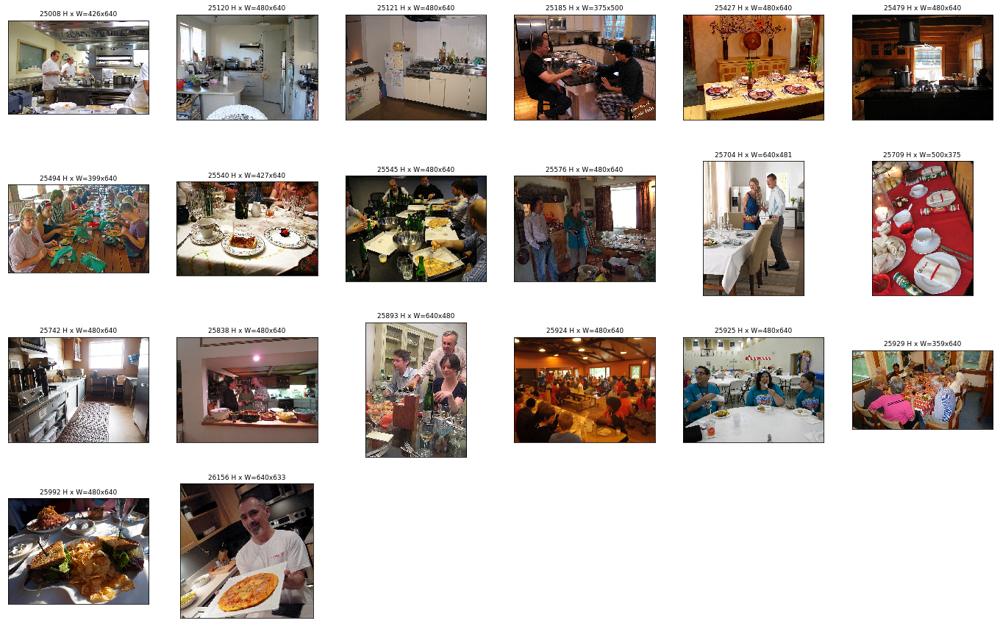

In [8]:
# image_list = list(range(16534, 16570))
# image_list = [ 600 , 1974, 619, 1112,  606, 1783,  225, 2237,  356,  807, 2099, 1311, 1786, 2260,  814,  739, 1368, 1127,  254, 2224, 1337]
image_list = list(range(534, 570))
image_list = IMAGE_LIST
image_titles = [str(i) for i in image_list[:20]]
images = get_image_batch(dataset_test, image_list)
visualize.display_images(images, titles = image_titles, cols = 6, width = 24)

### Get next image from generator and display 

image id :  16567
 Image_id    :  16567  Reference:  http://cocodataset.org/#explore?id=572110 Coco Id: 572110
 Image meta  :  [16567   361   640     3   223     0   801  1024]
 Class ids   :  (12,)    [44 44 45 45 46 70 40 44 44 44 73 77]
 Class Names :  ['knife', 'knife', 'spoon', 'spoon', 'bowl', 'oven', 'bottle', 'knife', 'knife', 'knife', 'refrigerator', 'scissors']
image id :  16567
 Image_id    :  16567  Reference:  http://cocodataset.org/#explore?id=572110 Coco Id: 572110
 Image meta  :  [16567   361   640     3   223     0   801  1024]
 Class ids   :  (12,)    [44 44 45 45 46 70 40 44 44 44 73 77]
 Class Names :  ['knife', 'knife', 'spoon', 'spoon', 'bowl', 'oven', 'bottle', 'knife', 'knife', 'knife', 'refrigerator', 'scissors']


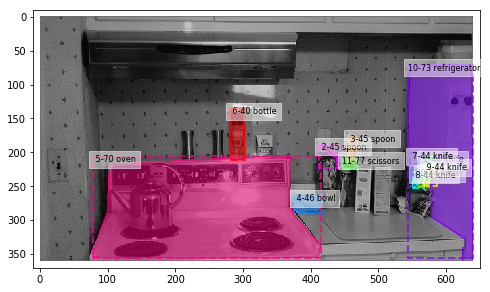

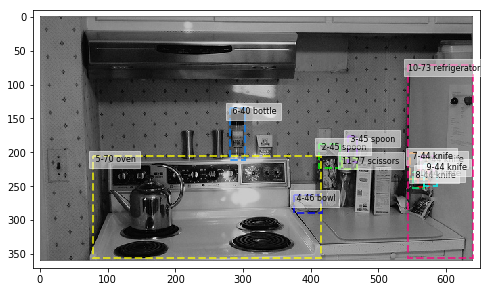

In [147]:
image_id = 16534
image_id = 16567
# test_batch_x, test_batch_y = next(test_generator)
# display_training_batch(dataset_test, test_batch_x, masks = True)
# test_batch_x = get_inference_batch(dataset_test, mrcnn_model ,generator = test_generator, display = True)
test_batch_x = get_inference_batch(dataset_test, mrcnn_model.config , image_ids = image_id, display = True, masks = True)
test_batch_x = get_inference_batch(dataset_test, mrcnn_model.config , image_ids = image_id, display = True, masks = False)

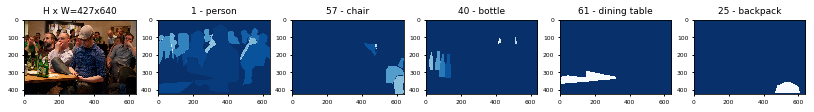

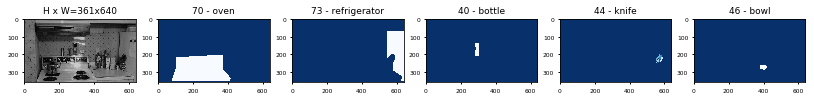

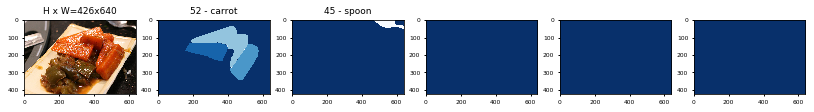

In [148]:
visualize.display_image_masks(dataset_test, [16534,16567,16536])

### Get images using a list of image ids

 Coco id:  207980  ---> dataset id: 25469
[40 40 42 42 43 43 44 44 44 44 44 44 44 44 44 44 44 44 45 45 45 45 46 46 46 46 46 46 69 70 73]

GT_BOXES for image  27755
--------------------------------------------------------------------------------
        class              |                              
seq  id name               |  Y1  X1  Y2  X2     CX     CY    AREA
--------------------------------------------------------------------------------
  0  40 bottle             |  302  703  337  733   718.0  319.5  1050.00
  1  40 bottle             |  312  688  339  696   692.0  325.5   216.00
  2  42 cup                |  506  797  563  869   833.0  534.5  4104.00
  3  42 cup                |  510  885  598  954   919.5  554.0  6072.00
  4  43 fork               |  542  488  736  640   564.0  639.0  29488.00
  5  43 fork               |  582  994  614 1018   1006.0  598.0   768.00
  6  44 knife              |  264  305  302  349   327.0  283.0  1672.00
  7  44 knife              |  605  

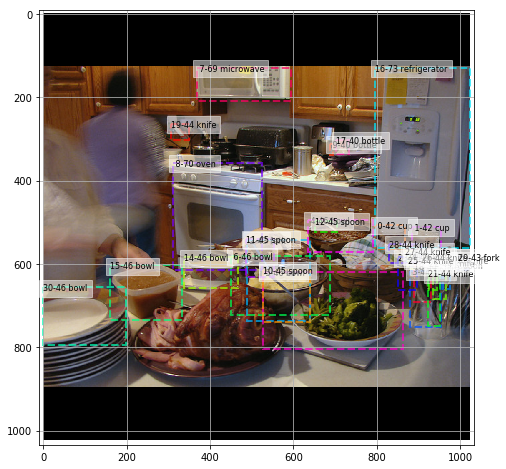

In [9]:
# IMAGE_LIST = [18388, 64305] # , 1507]
# IMAGE_LIST = [107639, 112710, 39775]
# IMAGE_LIST = [24627, 33758, 6749]
# IMAGE_LIST = [24627, 33758] # , 6749]
# IMAGE_LIST = [92929, 49399]   IMAGE_LIST = [88857, 74451]
# IMAGE_LIST = [8885]
IMAGE_LIST = [16534]
IMAGE_LIST = [547]
# image_id = 16567 ## 117 ## 16534 # 25469   # 4728
# coco_id = 47735
# coco_id = 144906
coco_id = 207980
# coco_id = 394595
# coco_id = 398494
# coco_id = 524645
# coco_id = 572110
image_id = get_coco_image_id(coco_id)
image_id = 27755
vis2.display_gt_bboxes(dataset_test, mrcnn_model.config, image_id)

# image_batch = get_image_batch(dataset_test, image_id, display=True)
# test_batch_x = get_training_batch(dataset_test, mrcnn_model.config, IMAGE_LIST)
# inference_batch, image_batch = get_inference_batch(dataset_test, mrcnn_model, IMAGE_LIST, display = True)

### Other display functions

#### Display top masks for sample images

In [ ]:
# Load and display random samples
image_ids = np.random.choice(dataset_test.image_ids, 7)
for image_id in image_ids:
    image = dataset_test.load_image(image_id)
    mask, class_ids = dataset_test.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset_test.class_names)

####  Dispaly a random image from dataset_test

In [ ]:
# Load random image and mask. ### 27711 persons and boats
image_id = np.random.choice(dataset_test.image_ids)
_ = batch_input = demo_image(dataset_test, mrcnn_model.config, image_id, masks = False)

#### Get an image and place into train_batch_x

In [ ]:
IMAGE_LIST= [30531]
batch_input = get_training_batch(dataset_test, mrcnn_model.config, 30531, masks = False)

## FCN detection using `fcn.detect()` - run `image_batch` Image List through model pipeline

In [10]:

fcn_results = run_fcn_detection(fcn_model, mrcnn_model, dataset_test, image_ids= image_id, verbose =0)


### Display Output

#### display output elements

In [249]:
np.set_printoptions(linewidth=180,precision=4,threshold=10000, suppress = True)
print(' Length of fcn_results: ', len(fcn_results))
f = fcn_results[0]
print(len(f.keys()), f.keys())
for i in f.keys():
    print('   {:.<25s}  {}'.format(i , f[i].shape))

 Length of fcn_results:  1
21 dict_keys(['pr_hm_scores', 'pr_scores_by_class', 'rois', 'image_meta', 'fcn_sm', 'gt_bboxes', 'fcn_hm_scores', 'molded_rois', 'detections', 'fcn_scores_by_class', 'gt_class_ids', 'fcn_hm', 'image', 'pr_scores', 'fcn_scores', 'pr_hm', 'scores', 'class_ids', 'orig_image_meta', 'molded_image', 'detection_ind'])
   pr_hm_scores.............  (81, 200, 24)
   pr_scores_by_class.......  (81, 200, 24)
   rois.....................  (27, 4)
   image_meta...............  (89,)
   fcn_sm...................  (256, 256, 81)
   gt_bboxes................  (12, 4)
   fcn_hm_scores............  (81, 200, 24)
   molded_rois..............  (27, 4)
   detections...............  (200, 7)
   fcn_scores_by_class......  (81, 200, 24)
   gt_class_ids.............  (12,)
   fcn_hm...................  (256, 256, 81)
   image....................  (361, 640, 3)
   pr_scores................  (27, 24)
   fcn_scores...............  (27, 24)
   pr_hm....................  (256, 256, 81)
  

#### display scores 

 Display pr_scores ; (27, 24)
PR_SCORES from fcn/mrcnn_results:
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                              |   |                |        MRCNN score 0       |          MRCNN score 1             |           MRCNN score 2            |                         
          class               |TP/| mrcnn  normlzd |  gaussian   bbox   nrm.scr*|  ga.sum    mask     score   norm   |  ga.sum    mask     score   norm   |                         
    seq  id name              | FP| score   score  |    sum      area   gau.sum |  in mask   sum              score  |  in mask   sum              score  |  X1  Y1  X2  Y2   AREA  
-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
  0 200 70 oven               | 1 | 0.996

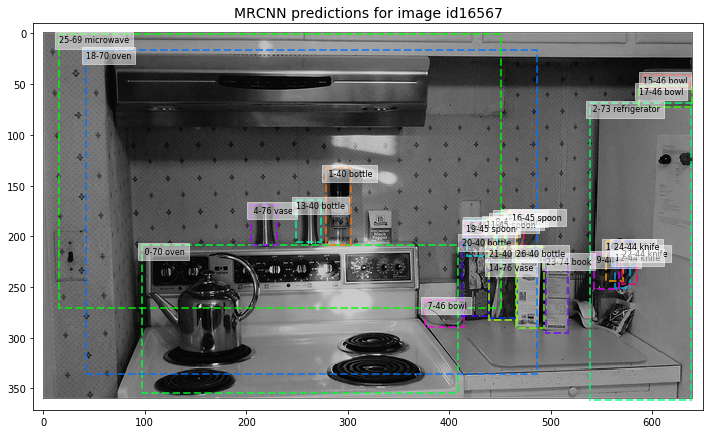

In [167]:
import mrcnn.visualize_2 as vis2
vis2.display_mrcnn_scores(f, class_names)

#### display scores 

In [43]:
float_formatter = lambda x: "%10.4f" % x
np_format = {}
np_format['float']=float_formatter
np.set_printoptions(linewidth=195, precision=3, floatmode='fixed', threshold =10000, formatter = np_format)


In [70]:
f = fcn_results[0]
for molded_bbox, cls, scr, pr_scr, fcn_scr in zip(f['molded_rois'].astype(np.int), f['class_ids'],  f['scores'], f['pr_scores'], f['fcn_scores']):
    print('{} {:2d}  {:.<18s}  {:5.4f} {}  '.format(molded_bbox, cls, dataset_test.class_names[cls], scr, fcn_scr[[4,5,6,7, 8]]))
    print('{:>86s} {}'.format(' mrcnn old style scores:  ',  pr_scr[[9,10,11]]))
    print('{:>86s} {}'.format(' fcn old style scores:    ', fcn_scr[[9,10,11]]))
    print()
    print('{:>86s} {}'.format(' mrcnn alt scores1:  ',pr_scr[[12,13,14,15,16,17]]))
    print('{:>86s} {}'.format(' mrcnn_scores2 :  ',   pr_scr[[18,19,20,21,22,23]]))
    print()
    print('{:>86s} {}'.format(' fcn alt scores1:  ',fcn_scr[[12,13,14,15,16,17]]))
    print('{:>86s} {}'.format(' fcn_scores2:  '    ,fcn_scr[[18,19,20,21,22,23]]))
    print()

[373   3 583  85] 63  tv................  0.9975 [   63.0000     0.9975     1.0000   200.0000     1.0000]  
                                                             mrcnn old style scores:   [    0.9984  1076.2500     0.9984]
                                                             fcn old style scores:     [    5.3745  1076.2500     5.3745]

                                                                  mrcnn alt scores1:   [   52.1878    77.0000     0.6778     1.0000     1.0000     1.0000]
                                                                     mrcnn_scores2 :   [   52.1878    77.0000     0.6778     1.0000     1.0000     1.0000]

                                                                    fcn alt scores1:   [   18.3261    77.0000     0.2380     1.0000     1.0000     1.0000]
                                                                        fcn_scores2:   [   48.2060    77.0000     0.6261     1.0000     1.0000     1.0000]

[128 234 883 463]  1  per

##  FCN detection using `fcn.run_inference_pipeline()` - run `IMAGE_LIST` through detection pipeline

Loading 2 images
image                    shape: (398, 640, 3)         min:    0.00000  max:  255.00000
image                    shape: (428, 640, 3)         min:    0.00000  max:  255.00000


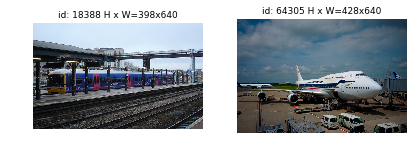

call mrcnn predict()
    Wrapper for Detection Layer : call()  <class 'list'> 4
     rpn_proposals_roi  : (2, 1000, 4) <class 'numpy.ndarray'>
     mrcnn_class.shape  : (2, 1000, 81) <class 'numpy.ndarray'>
     mrcnn_bboxes.shape : (2, 1000, 81, 4) <class 'numpy.ndarray'>
     image_meta         : (2, 89) <class 'numpy.ndarray'>


 Detections are:
[[517.     705.     582.     730.       1.       0.992 ]
 [454.      12.     614.     926.       7.       0.9695]
 [460.      77.     621.     243.       6.       0.7139]
 [521.     699.     571.     713.       1.       0.5538]
 [521.     723.     578.     738.       1.       0.5355]]


 Detections are:
[[ 436.       50.      686.      879.        5.        0.9997]
 [ 485.      936.      528.     1001.        5.        0.9936]
 [ 545.        0.      586.      220.        5.        0.9925]
 [ 742.      506.      838.      616.        8.        0.9227]
 [ 757.      284.      853.      554.        8.        0.9176]
 [ 652.      521.      716.  

In [81]:
# mrcnn_model.layer_info()
# fcn_model.layer_info()
# # IMAGE_LIST = [18388, 64305, 1507]
# # IMAGE_LIST = [24627, 33758] # , 6749]
IMAGE_LIST = [18388, 64305] #1507]
# IMAGE_LIST = [88857, 74451]
fcn_results = fcn_model.run_inference_pipeline(mrcnn_model, dataset_test, IMAGE_LIST, verbose = True)

## Visualize results from `fcn.run_inference_pipeline()`

In [11]:
img_id = 0
f = fcn_results[0]
coco_id = dataset_test.image_info[image_id]['id']
image_id=f['orig_image_meta'][0]
gt_class_ids = np.unique(f['gt_class_ids']).astype(int).tolist() 
pr_class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
fcn_class_ids = np.unique(f['fcn_scores'][:,4]).astype(int).tolist()
print('Image id: ',image_id, ' Coco ID: ', coco_id)
print('GT  class ids: ', gt_class_ids)
print('PR  class ids: ', pr_class_ids)
print('FCN class ids: ', fcn_class_ids)

Image id:  27755  Coco ID:  478227
GT  class ids:  [40, 42, 43, 44, 45, 46, 69, 70, 73]
PR  class ids:  [1, 40, 42, 45, 46, 51, 57, 61, 69, 70, 72, 73, 74, 76]
FCN class ids:  [1, 40, 42, 45, 46, 51, 57, 61, 69, 70, 72, 73, 74, 76]


 Display pr_scores ; (34, 24)
PR_SCORES from fcn/mrcnn_results:
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
                              |   |                |        MRCNN score 0       |          MRCNN score 1             |           MRCNN score 2            |                           
          class               |TP/| mrcnn  normlzd |  gaussian   bbox   nrm.scr*|  ga.sum    mask     score   norm   |  ga.sum    mask     score   norm   |                           
    seq  id name              | FP| score   score  |    sum      AREA   gau.sum |  in mask   sum              score  |  in mask   sum              score  |  X1  Y1  X2  Y2   CX   CY 
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
  0 200 69 micr

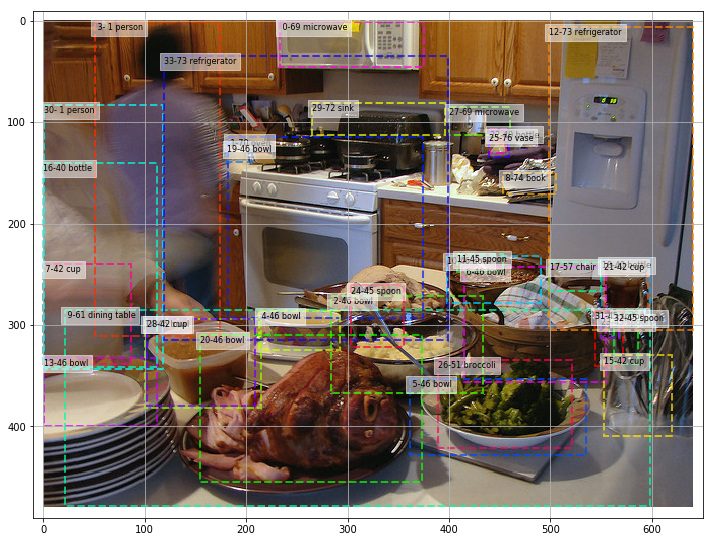

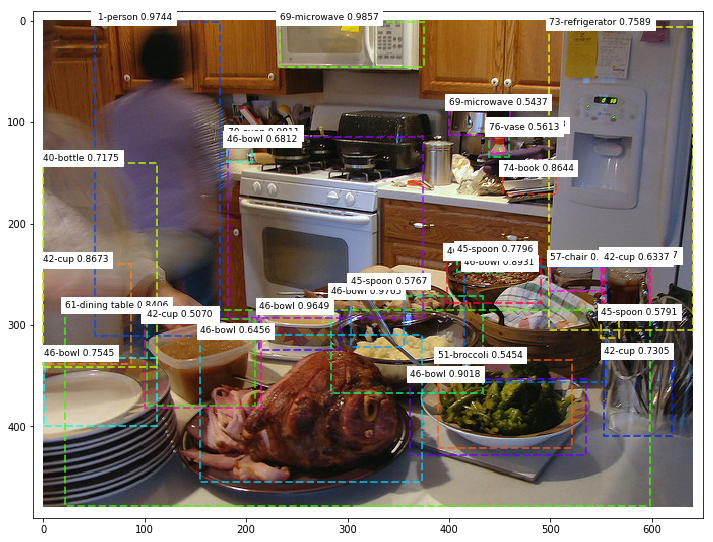

In [13]:
np.set_printoptions(linewidth=185,precision=4,threshold=10000, suppress = True)
vis2.display_mrcnn_scores(f, class_names)
vis3.display_instances_w_scores(f, class_names = class_names, score_column = 5, score_range=(0.50, 1.05))

## 2D heatmaps

In [14]:
# print(f['image'].dtype, f['image'].min(), f['image'].max())
# print(f['molded_image'].dtype, f['molded_image'].min(), f['molded_image'].max())
# visualize.display_image(utils.unmold_image(f['molded_image'], mrcnn_model.config), figsize=(3,3))
print('Image id: ',image_id, ' Coco ID: ', coco_id)
print('GT  class ids: ', gt_class_ids)
print('PR  class ids: ', pr_class_ids)
print('FCN class ids: ', fcn_class_ids)

Image id:  27755  Coco ID:  478227
GT  class ids:  [40, 42, 43, 44, 45, 46, 69, 70, 73]
PR  class ids:  [1, 40, 42, 45, 46, 51, 57, 61, 69, 70, 72, 73, 74, 76]
FCN class ids:  [1, 40, 42, 45, 46, 51, 57, 61, 69, 70, 72, 73, 74, 76]


478227
Class Ids :  [         1         40         42         45         46         51         57         61         69         70         72         73         74         76]
 Scaling options are 'all', 'class'/'each', 'clip', or 'none' 
0
 Shape of Z:  (256, 256, 81)  boxes:  (81, 200, 24)
 Image Id:  0  Display classes: [1, 40, 42, 45, 46]
 min_z_all shape: ()  min_z_all: 0.0  max_z_all: () max_z_all: 1.0
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == none 
 rows   6  columns : 6 boxes.shape :  (81, 200, 24)
1 alpha : 0.6
1 alpha : 0.6


/home/kbardool/anaconda3/envs/TFG/lib/python3.5/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


1 alpha : 0.6
1 alpha : 0.6
1 alpha : 0.6


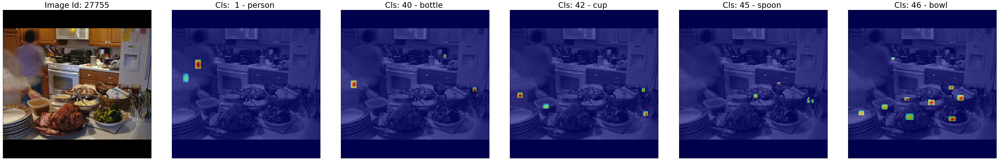

In [37]:
img_id = 0
print(coco_id)
pr_class_ids = np.unique(f['class_ids'])
print('Class Ids : ', pr_class_ids)
# cls_ids = pr_class_ids
# cols = len(pr_class_ids)
# cls_ids = gt_class_ids
# cls_ids     = [ 1, 40, 42, 57, 61, 66, 67, 68, 69, 70] ##47735
# cls_ids   =  [1, 40, 42, 57, 61, 66]                     ##47735
# cls_ids   = [ 1,  3, 33, 35, 37, 38, 39, 40, 41, 42]  ## 144906
# cls_ids   = [ 1,  3, 33, 35, 37, 39]                  ## 144906
# cls_ids = [33, 36, 40, 52, 53, 56, 61, 64, 65, 80]  ## 207980
cls_ids = [33, 36, 40, 47, 52, 53]              ## 207980
# cls_ids = [ 40, 42, 46, 59, 61, 65, 66, 72, 73, 76] ## 394595
# cls_ids = [  2, 40, 42, 45, 46, 61, 70, 72, 73, 74] ## 398494
# cls_ids = [ 12, 25, 40, 42, 43, 44, 46, 61, 69, 70]   ## 524645
# cls_ids = [ 1, 25, 40, 42, 43, 69]   ## 524645
cls_ids = [1, 40, 42, 45, 46, 51, 57, 61, 69, 70, 72, 73, 74, 76];   ## 478227
cls_ids = [1, 40, 42, 45, 46];   ## 478227
# cls_ids = [40, 44, 45, 46, 69, 70, 73, 74, 76, 79]  ## 572110
# cls_ids=  [1, 61, 40, 42, 57]
# cls_ids = [40,44,70, 73,76]
# cls_ids = [33, 36, 56, 52,64]
# cls_ids = [ 1, 69, 40, 42,46]
# fig = vis3.plot_2d_heatmap(f['pr_hm'], f['pr_scores_by_class'], img_id, cls_ids, columns = cols, num_bboxes = 0,
#                           class_names = class_names, scale = 4, scaling = 'none')
fig = vis3.plot_2d_heatmaps_poster(fcn_results, img_id, hm = 'pr_hm', class_ids = cls_ids, columns = 6, num_bboxes = 0,  config = mrcnn_model.config,
                          class_names = class_names, scale = 4, scaling = 'none', fontsize = 30)
fig.savefig('pr_hm_i'+str(coco_id)+'_small.png')

 Scaling options are 'all', 'class'/'each', 'clip', or 'none' 
 Shape of Z:  (256, 256, 81)  boxes:  (81, 200, 24)
 Image Id:  0  Display classes: [1, 40, 42, 45, 46]
 min_z_all shape: ()  min_z_all: -0.53146267  max_z_all: () max_z_all: 1.1870222
 min_z_cls shape: (1, 1, 81)  max_z_cls shape: (1, 1, 81)
 SCALING == none 
 rows   6  columns : 6 boxes.shape :  (81, 200, 24)


/home/kbardool/anaconda3/envs/TFG/lib/python3.5/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


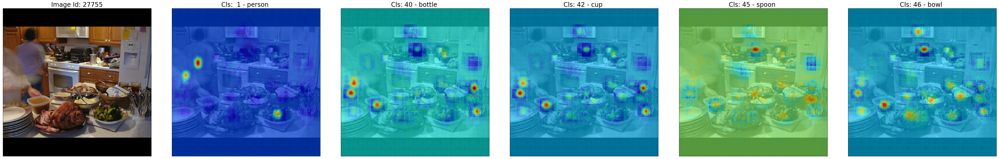

In [21]:
img_id = 0
pr_class_ids = np.unique(f['class_ids'])
# cls_ids = pr_class_ids
# fig = visualize.plot_2d_heatmap(f['fcn_hm'], f['fcn_scores_by_class'], img_id, cls_ids, columns = 5, num_bboxes = 0,
#                           class_names = class_names, scale = 4, scaling = 'none')
fig = vis3.plot_2d_heatmaps_poster(fcn_results, 0, hm = 'fcn_hm', class_ids= cls_ids, columns = 6, num_bboxes = 0, config = mrcnn_model.config,
                          class_names = class_names, scale = 4, scaling = 'none')
fig.savefig('fcn_hm_i'+str(coco_id)+'_small.png')

### Overlay image with pred_heatmaps

class ids:  [40, 44, 45, 46, 69, 70, 73, 74, 76]
 Scaling options are:  'all', 'class'/'each' , or  'clip' 
 heatmap shape:  (256, 256, 81)  Bounding boxes shape:  (81, 200, 24)
Display classes: [40, 44, 70, 73, 76]


/home/kbardool/anaconda3/envs/TFG/lib/python3.5/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


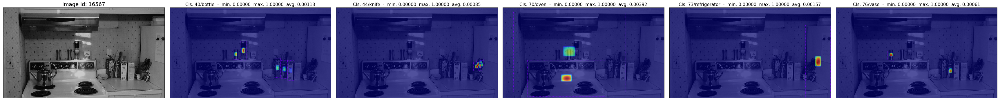

In [433]:
class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
print('class ids: ', class_ids)
fig = vis3.inference_heatmaps_display_poster(fcn_results, image_id = 0, 
                           class_ids = cls_ids, 
                           class_names = dataset_test.class_names, 
                           hm = 'pr_hm' ,
                           config = mrcnn_model.config,
                           columns = 6,
                           scaling = 'class')
fig.savefig('pr_hm_i'+str(coco_id)+'_orig_size.png')

 Scaling options are:  'all', 'class'/'each' , or  'clip' 
 heatmap shape:  (256, 256, 81)  Bounding boxes shape:  (81, 200, 24)
Display classes: [40, 44, 70, 73, 76]


/home/kbardool/anaconda3/envs/TFG/lib/python3.5/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


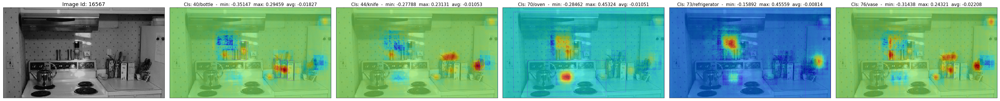

In [434]:
fig = vis3.inference_heatmaps_display_poster(fcn_results, image_id = 0, 
                           class_ids = cls_ids, 
                           class_names = dataset_test.class_names, 
                           hm = 'fcn_hm' ,
                           config = mrcnn_model.config,
                           columns = 6,
                           scaling = 'class')
fig.savefig('fcn_hm_i'+str(coco_id)+'_orig_size.png')

### Overlay image with fcn_heatmaps

In [ ]:
from mrcnn.visualize import display_heatmaps, display_heatmaps_fcn, display_heatmaps_mrcnn, inference_heatmaps_display
# visualize.display_image_bw(image)
# print(model_gt_heatmap_scores.shape)
class_ids = np.unique(f['pr_scores'][:,4]).astype(int).tolist()
print('class ids: ', class_ids)
inference_heatmaps_display(fcn_results, 0, class_ids = class_ids, class_names = coco_class_names, hm = 'fcn_hm' ,config = mrcnn_model.config, scaling = 'class') 
# , display_heatmaps_mrcnn(train_batch_x, model_output, 0, hm = 'pr',  

### Overlay image with pr_heatmaps and fcn_heatmaps

 Scaling options are: 'all', 'class', 'each' , or  'clip' : 
 heatmap shape:  (256, 256, 81)
 Bounding boxes shape:  (81, 200, 24)
Image shape : (361, 640, 3)  class_ids: [40 44 45 46 69 70 73 74 76]


/home/kbardool/anaconda3/envs/TFG/lib/python3.5/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


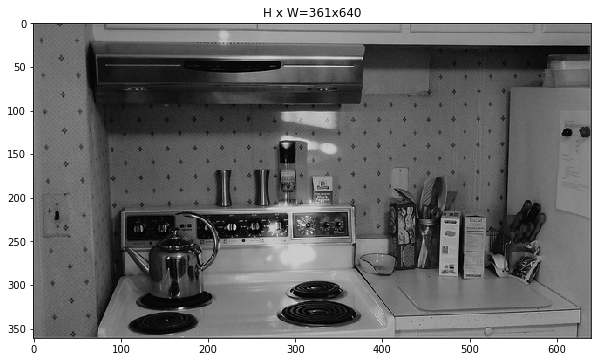

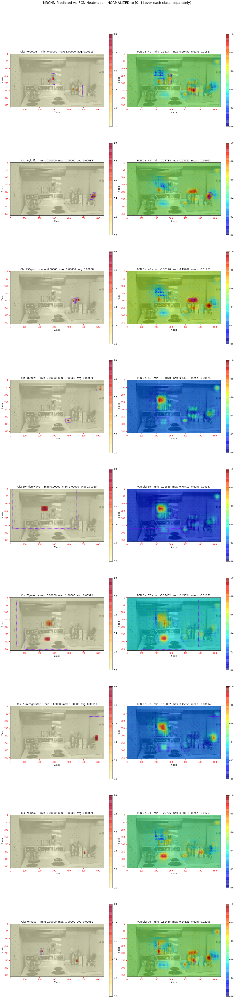

In [259]:
visualize.inference_heatmaps_compare(fcn_results, image_id = 0 , hm = 'fcn_hm', 
                     config = mrcnn_model.config, class_ids = pr_class_ids, class_names = class_names, scaling = 'each')

####  3D comparative display `pred_heatmap` / `fcn_heatmap` 

3
Image : 0  Predicted    ClassIds: [0, 1, 40, 42, 57, 61, 66]
Display classes: [0, 1, 40, 42, 57, 61, 66]
 image height/width  256 256
shape pos  (256, 256, 2) shape Z1:  (256, 256, 81) shape Z2: (256, 256, 81)
 min_z1_all shape: ()  min_z1_all: 0.0  max_z1_all: () max_z1_all: 1.0
 min_z2_all shape: ()  min_z2_all: -0.43362135  max_z2_all: () max_z2_all: 1.1540563
ttl:  HM1 Img:  0 Cls:  0/BG  -  min: 0.00000  max: 0.00000
ttl:  HM2 Img:  0 Cls:  0/BG  -  min: -0.09116  max: 0.08676
ttl:  HM1 Img:  0 Cls:  1/person  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls:  1/person  -  min: -0.18603  max: 1.15406
ttl:  HM1 Img:  0 Cls: 40/bottle  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls: 40/bottle  -  min: -0.16114  max: 0.47081
ttl:  HM1 Img:  0 Cls: 42/cup  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls: 42/cup  -  min: -0.14963  max: 0.42515
ttl:  HM1 Img:  0 Cls: 57/chair  -  min: 0.00000  max: 1.00000
ttl:  HM2 Img:  0 Cls: 57/chair  -  min: -0.11275  max: 0.25703
ttl

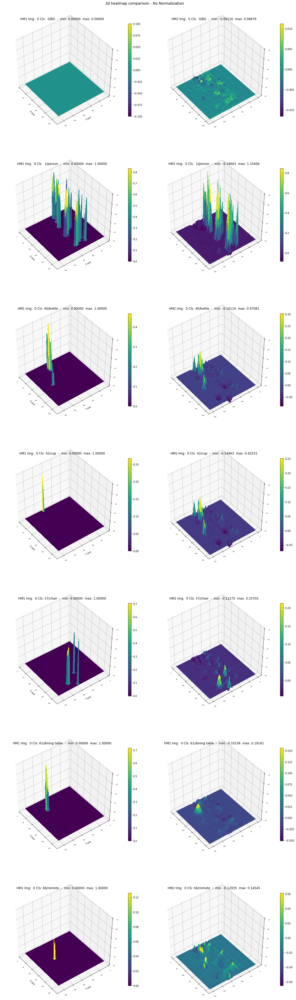

In [247]:
img_id = 0
r = fcn_results[img_id]
print(f['pr_scores_by_class'].ndim)
# print('Image id: ',image_id, ' Coco ID: ', dataset_train.image_info[image_id]['id'])
pr_class_ids = np.unique(f['pr_scores_by_class'][:,:,4]).astype(int).tolist()
print('Image : {}  Predicted    ClassIds: {}'.format(img_id, pr_class_ids))

visualize.plot_3d_heatmap_compare(f['pr_hm'], f['fcn_hm'], 0, class_ids = pr_class_ids, 
                            class_names = class_names, size=(8,8), zlim = 'all' , scaling = 'none')    